In [ ]:
#!unzip "drive/MyDrive/Dog-VIsion/dog-breed-identification.zip" -d "drive/MyDrive/Dog-VIsion/"

In [ ]:
# End to end multi-class dog classfication

Get Workspace Ready

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)
print(hub.__version__)
# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

2.15.0
0.15.0
GPU available


In [ ]:
# Turning data into tensors(numbers)
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog-VIsion/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

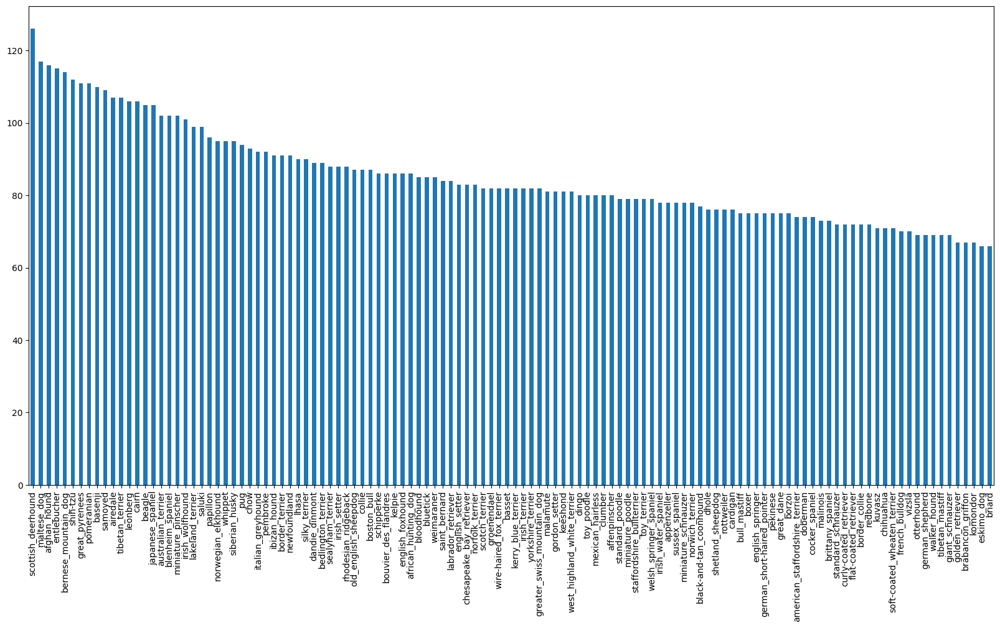

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

In [ ]:
# view an image
from IPython.display import Image
#Image('drive/MyDrive/Dog-VIsion/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# create pathnames from image IDs
filenames = ['drive/MyDrive/Dog-VIsion/train/' + fname + '.jpg' for fname in labels_csv['id']]

filenames[:10]

['drive/MyDrive/Dog-VIsion/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-VIsion/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-VIsion/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-VIsion/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-VIsion/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-VIsion/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-VIsion/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-VIsion/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-VIsion/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-VIsion/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check number of filenames match number of actual image files
import os
if len(os.listdir('drive/MyDrive/Dog-VIsion/train/')) == len(filenames):
  print('match')
else:
  print('no match')

match


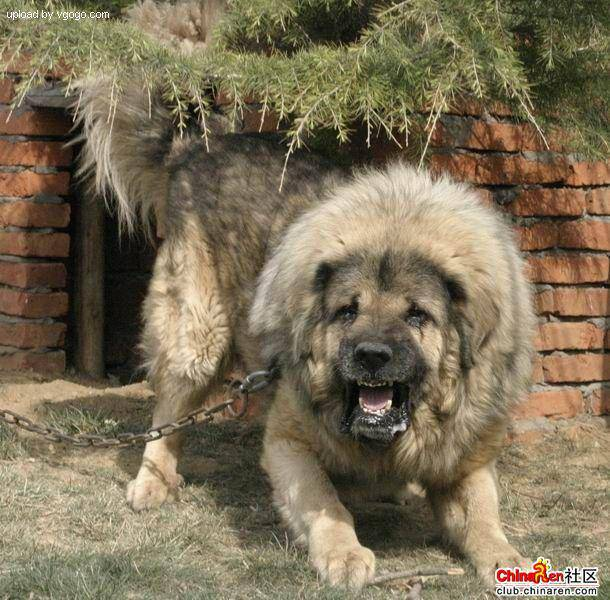

In [ ]:
#One more check
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Prepare labels

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
#Check if num of label = num of filenames
if len(labels) == len(filenames):
  print('match')
else:
  print('not match')

match


In [ ]:
#Find unique labels
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a label into array of bool
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every label into bool array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# create validation set
X = filenames
y = boolean_labels


We are going to start off with 1000 images

In [ ]:
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [ ]:
# Split into train and validation
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train)

800

In [ ]:
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog-VIsion/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog-VIsion/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog-VIsion/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog-VIsion/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog-VIsion/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

Preprocessing images(turning into tensors)

In [ ]:
# convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)[:2], image[:2]

(<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
 array([[[ 89, 137,  89],
         [ 76, 124,  76],
         [ 63, 111,  61],
         ...,
         [ 77, 133,  86],
         [ 76, 134,  86],
         [ 76, 134,  86]],
 
        [[ 72, 119,  75],
         [ 67, 114,  68],
         [ 63, 110,  64],
         ...,
         [ 75, 131,  84],
         [ 74, 132,  84],
         [ 74, 132,  84]]], dtype=uint8)>,
 array([[[ 89, 137,  89],
         [ 76, 124,  76],
         [ 63, 111,  61],
         ...,
         [ 77, 133,  86],
         [ 76, 134,  86],
         [ 76, 134,  86]],
 
        [[ 72, 119,  75],
         [ 67, 114,  68],
         [ 63, 110,  64],
         ...,
         [ 75, 131,  84],
         [ 74, 132,  84],
         [ 74, 132,  84]]], dtype=uint8))

In [ ]:
IMG_SIZE = 224

# Create a func for preprocessing

def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image and turns to a tensor
  """

  # read image
  image = tf.io.read_file(image_path)
  # Turn jpeg into tensor with 3 color channels rgb
  image = tf.image.decode_jpeg(image, channels=3)
  #convert color channel values from 0-255 to 0-1 values (normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

In [ ]:
# Turning our data into batches
# Create a func that returns a tuple of tensors

def get_image_labels(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Turn all our data into batches tuples of tensors

In [ ]:
BATCH_SIZE = 32

# create a func
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  create batches out of X and y
  shuffles data if its training but does not shuffle if its validation data
  Also accepts test data as input (no labels)
  """
  if test_data:
    print('creating test data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print('creating validation batch')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_labels).batch(BATCH_SIZE)
    return data_batch
  else:
    print('training data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_labels)
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

training data batches
creating validation batch


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
# Visualizing data batch
import matplotlib.pyplot as plt

# creating a func for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and labels from a batch
  """
  plt.figure(figsize=(10, 10))

  for i in range(25):
    #cretae subplots
    ax = plt.subplot(5, 5, i + 1)
    # Display an image
    plt.imshow(image[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
val_images, val_labels = next(val_data.as_numpy_iterator())
#train_images, train_labels

In [ ]:
len(train_images), len(train_labels)

(32, 32)

In [ ]:
#show_25_images(val_images, val_labels)

In [ ]:
# Building a model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

OUTPUT_SHAPE = len(unique_breeds)

#Setup model url from tensorflow hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

In [ ]:
# create a func which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  model = tf.keras.Sequential([
                                hub.KerasLayer(MODEL_URL),
                                tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                      activation="softmax")
  ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
# Creating callbacks
# Tensorboard callbacks

%load_ext tensorboard

In [ ]:
import datetime

# create a func to build a tensorboard callback
def create_tensorboardcallback():
  logdir = os.path.join("drive/MyDrive/Dog-VIsion/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
#Early Stopping Callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)


In [ ]:
# Training a model (on a subset of data)

NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we are on GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "no gpu")

GPU available


In [ ]:
#function that trains a model
def train_model():
  """
  Trains a model and returns it
  """
  #create
  model = create_model()
  #create new tensorboard session evertime we train a model
  tensorboard = create_tensorboardcallback()
  #fit model to data passing it callback
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
model = train_model()

Epoch 1/100
25/25 [==============================] - 165s 6s/step - loss: 4.5371 - accuracy: 0.1013 - val_loss: 3.2852 - val_accuracy: 0.2950
Epoch 2/100
25/25 [==============================] - 2s 95ms/step - loss: 1.6328 - accuracy: 0.6963 - val_loss: 2.0911 - val_accuracy: 0.5350
Epoch 3/100
25/25 [==============================] - 2s 96ms/step - loss: 0.5683 - accuracy: 0.9225 - val_loss: 1.5917 - val_accuracy: 0.6200
Epoch 4/100
25/25 [==============================] - 4s 174ms/step - loss: 0.2587 - accuracy: 0.9850 - val_loss: 1.4189 - val_accuracy: 0.6550
Epoch 5/100
25/25 [==============================] - 4s 177ms/step - loss: 0.1496 - accuracy: 0.9962 - val_loss: 1.3416 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 2s 97ms/step - loss: 0.1033 - accuracy: 1.0000 - val_loss: 1.3008 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================] - 2s 98ms/step - loss: 0.0766 - accuracy: 1.0000 - val_loss: 1.2571 - val_accuracy: 0.6700
Epoc

In [ ]:
 #checking the tensorboard logs

%tensorboard --logdir drive/MyDrive/Dog-VIsion/logs

<IPython.core.display.Javascript object>

In [ ]:
#making predictions with model

predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 81ms/step


array([[1.01315265e-03, 1.08169224e-04, 2.98580911e-04, ...,
        4.08715277e-04, 4.18447780e-05, 2.70639919e-03],
       [1.71257299e-03, 4.18152107e-04, 1.30187850e-02, ...,
        1.01034530e-04, 2.42003053e-03, 7.85306693e-05],
       [7.63114949e-05, 7.16906143e-05, 1.79317994e-05, ...,
        1.98693178e-05, 2.55620762e-05, 4.55593326e-05],
       ...,
       [1.95029661e-05, 2.29105262e-05, 6.98041913e-05, ...,
        9.74181148e-06, 8.31655634e-05, 2.31621685e-04],
       [1.02854252e-03, 9.12806427e-05, 1.63966892e-04, ...,
        9.58400851e-05, 5.57928113e-04, 1.51054319e-02],
       [2.38329885e-04, 6.49423600e-05, 7.19848671e-04, ...,
        1.08977417e-02, 3.03396257e-03, 4.71205101e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
index=0
print(predictions[index])
print(np.max(predictions[index]))
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.01315265e-03 1.08169224e-04 2.98580911e-04 4.01100770e-05
 9.41861712e-04 1.71256324e-05 3.31673659e-02 1.15044997e-04
 1.19496959e-04 2.94247060e-04 3.62184888e-04 1.76229878e-04
 3.13551631e-04 1.77404108e-05 9.92856571e-04 1.70816656e-03
 1.69725608e-04 9.16490406e-02 4.90314487e-05 3.27176967e-05
 5.08868077e-04 4.01608355e-04 4.57408387e-05 1.56826281e-03
 2.60964407e-05 4.78975300e-04 2.29040891e-01 4.55613372e-05
 5.27665310e-04 9.06293280e-05 4.33916546e-04 2.59063003e-04
 6.64347375e-04 5.17164335e-06 8.13351871e-05 7.50639886e-02
 5.98761108e-05 1.13245929e-04 1.02526406e-04 1.75755238e-04
 2.23216624e-03 6.08944101e-05 4.15240094e-04 5.26859549e-05
 2.86735129e-04 2.56670348e-04 8.63367968e-05 1.90858016e-04
 1.88098056e-04 1.52150475e-04 1.49458193e-03 2.96808794e-05
 8.38178676e-05 3.35107943e-05 1.08388143e-04 1.68843238e-04
 1.92893378e-04 3.30478186e-03 4.15780582e-04 2.67576985e-02
 3.85491963e-04 9.83839491e-05 4.94958833e-03 7.62064474e-06
 9.10765375e-04 6.722035

In [ ]:
# turn predictions probabilities into thier respective label
def get_pred_label(prediction_probablilties):
  return unique_breeds[np.argmax(prediction_probablilties)]

pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
# create a func to unbatch
def unbatchify(data):
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
images_ = []
labels_ = []

#loop through
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
images_[0]


array([[[0.29599646, 0.43284872, 0.3056691 ],
        [0.26635826, 0.32996926, 0.22846507],
        [0.31428418, 0.27701408, 0.22934894],
        ...,
        [0.77614343, 0.82320225, 0.8101595 ],
        [0.81291157, 0.8285351 , 0.8406944 ],
        [0.8209297 , 0.8263737 , 0.8423668 ]],

       [[0.2344871 , 0.31603682, 0.19543913],
        [0.3414841 , 0.36560842, 0.27241898],
        [0.45016077, 0.40117094, 0.33964607],
        ...,
        [0.7663987 , 0.8134138 , 0.81350833],
        [0.7304248 , 0.75012016, 0.76590735],
        [0.74518913, 0.76002574, 0.7830809 ]],

       [[0.30157745, 0.3082587 , 0.21018331],
        [0.2905954 , 0.27066195, 0.18401104],
        [0.4138316 , 0.36170745, 0.2964005 ],
        ...,
        [0.79871625, 0.8418535 , 0.8606443 ],
        [0.7957738 , 0.82859945, 0.8605655 ],
        [0.75181633, 0.77904975, 0.8155256 ]],

       ...,

       [[0.9746779 , 0.9878955 , 0.9342279 ],
        [0.99153054, 0.99772066, 0.9427856 ],
        [0.98925114, 0

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if(pred_label == true_label):
    color="green"
  else:
    color="red"
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

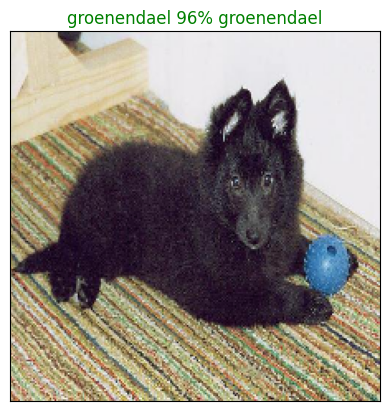

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=89)

In [ ]:
# create a func that shows top 10 predictions
def plot_pred_conf(predictions_probabilities, labels, n=1):
  """
  Plot top 10
  """
  pred_prob, true_label = predictions_probabilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  top_10_pred_values = pred_prob[top_10_pred_indexes]

  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels,)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

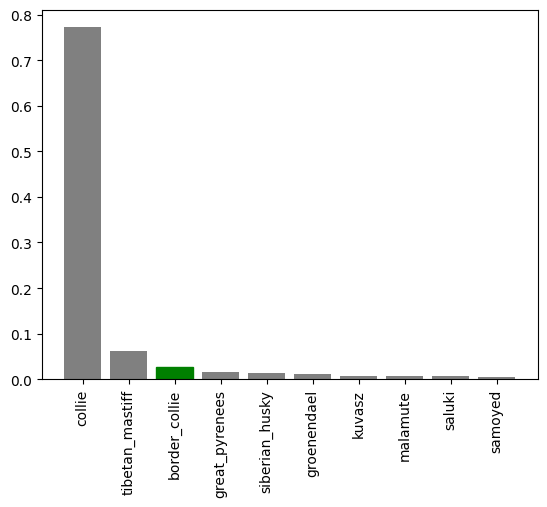

In [ ]:
plot_pred_conf(predictions_probabilities=predictions,
               labels=val_labels,
               n=9)

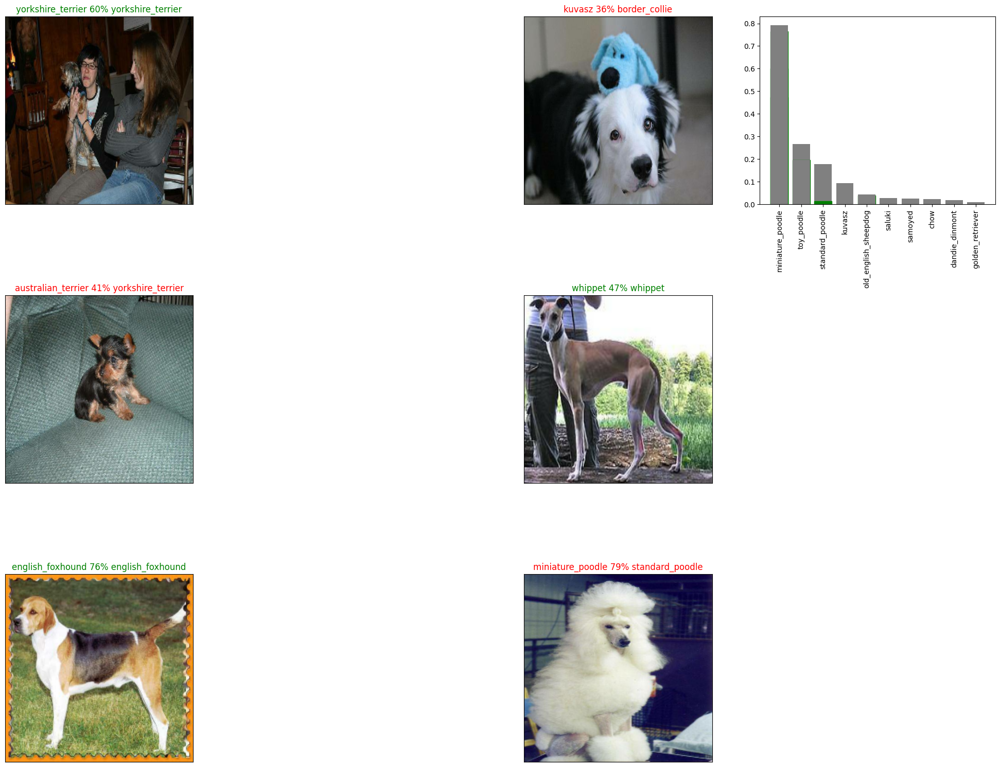

In [ ]:
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*1+2)
  plot_pred_conf(predictions_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
# saving a model
def save_model(model, suffix=None):
  """
  saves a given model and appends a suffix string.
  """
  #create directory
  modeldir = os.path.join("drive/MyDrive/Dog-VIsion/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  model.save(model_path)
  return model_path

In [ ]:
# load a trained model
def load_model(model_path):
  """
  loads a saved model from path
  """
  print(f"loading saved model : {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model



In [ ]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog-VIsion/models/20240112-09001705050012-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog-VIsion/models/20240112-09001705050012-1000-images-mobilenetv2-Adam.h5")

loading saved model : drive/MyDrive/Dog-VIsion/models/20240112-09001705050012-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate presaved model
model.evaluate(val_data)

7/7 [==============================] - 1s 158ms/step - loss: 1.1797 - accuracy: 0.6800


[1.1796860694885254, 0.6800000071525574]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 94ms/step - loss: 1.1797 - accuracy: 0.6800


[1.1796860694885254, 0.6800000071525574]

In [ ]:
# training a big model on the full data
len(X), len(y)

(10222, 10222)

In [ ]:
len(X_train)

800

In [ ]:
#create a data batch with the full dataset

full_data = create_data_batches(X, y)

training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# create a model
full_model = create_model()

In [ ]:
# create full model callbacks
full_model_tensorboard = create_tensorboardcallback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 100ms/step - loss: 1.3435 - accuracy: 0.6677
Epoch 2/100
320/320 [==============================] - 28s 88ms/step - loss: 0.4038 - accuracy: 0.8813
Epoch 3/100
320/320 [==============================] - 27s 86ms/step - loss: 0.2367 - accuracy: 0.9346
Epoch 4/100
320/320 [==============================] - 26s 81ms/step - loss: 0.1545 - accuracy: 0.9622
Epoch 5/100
320/320 [==============================] - 26s 82ms/step - loss: 0.1047 - accuracy: 0.9792
Epoch 6/100
320/320 [==============================] - 28s 86ms/step - loss: 0.0771 - accuracy: 0.9860
Epoch 7/100
320/320 [==============================] - 31s 96ms/step - loss: 0.0573 - accuracy: 0.9932
Epoch 8/100
320/320 [==============================] - 27s 83ms/step - loss: 0.0454 - accuracy: 0.9957
Epoch 9/100
320/320 [==============================] - 26s 81ms/step - loss: 0.0387 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 28s 87ms/step - 

In [ ]:
save_model(full_model, suffix="full-image-set-mobilev2-Adam")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog-VIsion/models/20240112-09331705051985-full-image-set-mobilev2-Adam.h5'

In [ ]:
loaded_full_model = load_model("drive/MyDrive/Dog-VIsion/models/20240112-09331705051985-full-image-set-mobilev2-Adam.h5")

loading saved model : drive/MyDrive/Dog-VIsion/models/20240112-09331705051985-full-image-set-mobilev2-Adam.h5


In [ ]:
# making predictions on test dataset
test_path = "drive/MyDrive/Dog-VIsion/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog-VIsion/test/e26d745f820e6b14cae26bb5def0648f.jpg',
 'drive/MyDrive/Dog-VIsion/test/e021107c3f07749e5f5b389e57e21ded.jpg',
 'drive/MyDrive/Dog-VIsion/test/e5ba665e01b6927411d60158f28160dd.jpg',
 'drive/MyDrive/Dog-VIsion/test/dfc0659b3b6eff35dc50d2501f1ea247.jpg',
 'drive/MyDrive/Dog-VIsion/test/ddf2401701ee374c0f1f9dd607071ec7.jpg',
 'drive/MyDrive/Dog-VIsion/test/e14cc46044a0fb31554250b07c93bd48.jpg',
 'drive/MyDrive/Dog-VIsion/test/e421e13d0d4c977ab89fa9965221809c.jpg',
 'drive/MyDrive/Dog-VIsion/test/e119301e11d4f1620948c3e6f5a3f021.jpg',
 'drive/MyDrive/Dog-VIsion/test/e0c767bc2bc03b909526f1861c712b13.jpg',
 'drive/MyDrive/Dog-VIsion/test/deed28298a869f87cf0372f592a21d43.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
#create test data batch
test_data = create_data_batches(X=test_filenames, test_data=True)

creating test data batches


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# make predictions on test data batch of full model
#calling predict on full model will take a long time to run
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1503s 5s/step


In [ ]:
np.savetxt("drive/MyDrive/Dog-VIsion/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions = np.loadtxt("drive/MyDrive/Dog-VIsion/preds_array.csv", delimiter=",")

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
# Preparing test dataset predictions for kaggle

preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e26d745f820e6b14cae26bb5def0648f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e021107c3f07749e5f5b389e57e21ded,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e5ba665e01b6927411d60158f28160dd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,dfc0659b3b6eff35dc50d2501f1ea247,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ddf2401701ee374c0f1f9dd607071ec7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e26d745f820e6b14cae26bb5def0648f,2.220164e-07,2.449716e-06,6.922579e-06,4.387727e-07,4.840389e-03,3.677410e-06,3.688391e-07,1.044777e-04,1.684792e-06,...,5.405620e-07,2.515610e-03,4.002046e-07,4.213948e-08,6.983028e-05,1.671528e-06,7.187936e-06,8.308041e-05,1.587554e-04,2.507712e-07
1,e021107c3f07749e5f5b389e57e21ded,9.802790e-11,1.234335e-08,1.462789e-06,4.576668e-11,1.396214e-09,2.889181e-07,5.307352e-07,8.656718e-07,2.091446e-11,...,9.886385e-11,1.518313e-08,5.278326e-10,1.134510e-09,3.059335e-09,9.345717e-08,4.950642e-08,5.752221e-11,4.885759e-07,3.413634e-11
2,e5ba665e01b6927411d60158f28160dd,9.099133e-11,1.597871e-10,9.996620e-01,1.780602e-11,1.179363e-10,1.301503e-13,3.438657e-06,1.482386e-09,1.588778e-10,...,5.802665e-08,3.539177e-08,5.575043e-10,1.031487e-12,8.539273e-11,2.103914e-10,2.130937e-10,3.072777e-10,7.213621e-11,1.197090e-10
3,dfc0659b3b6eff35dc50d2501f1ea247,3.619020e-10,8.618357e-10,8.487484e-12,4.420256e-03,1.264648e-02,1.896413e-03,2.175039e-03,5.482243e-08,4.808346e-09,...,3.395124e-09,2.385407e-06,1.069154e-07,7.353385e-05,9.928120e-08,6.280546e-06,2.679289e-07,5.253663e-11,5.915957e-09,2.729533e-04
4,ddf2401701ee374c0f1f9dd607071ec7,1.313953e-08,1.597386e-07,3.756103e-10,3.873977e-09,1.363631e-10,1.824839e-08,3.655560e-11,6.125918e-11,3.897326e-11,...,7.065721e-08,3.660223e-10,8.320885e-11,1.599747e-10,4.618129e-10,1.278390e-11,1.118905e-08,2.092774e-08,1.374419e-08,8.038605e-05


In [ ]:
preds_df.to_csv("drive/MyDrive/Dog-VIsion/full_model_predictions_1_mobilenetV2.csv",
                index=False)

In [ ]:
# making predictions on custom images
